# Visualizing Ground Truths after Manually adjusting image names in JSON

Success to load image at /kaggle/input/map-code-test-nov-14/mAP_test/RawImage/Hnetcom--img-43fd-81fd-2acbb4b45a8d.png


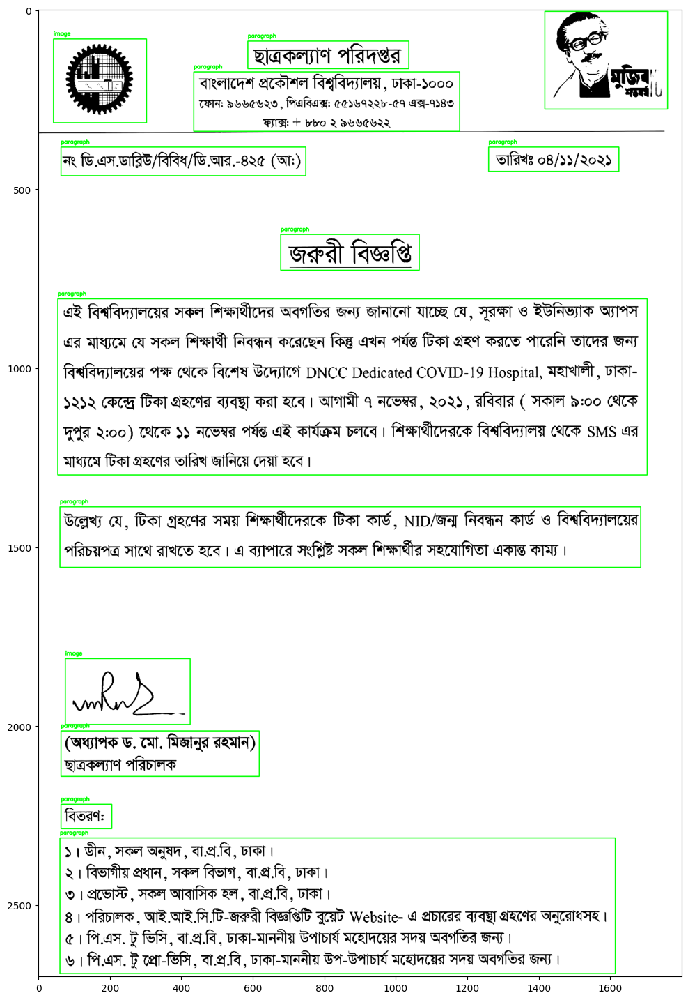

Success to load image at /kaggle/input/map-code-test-nov-14/mAP_test/RawImage/WordRand-img-423a-833d-179d651233ea.png


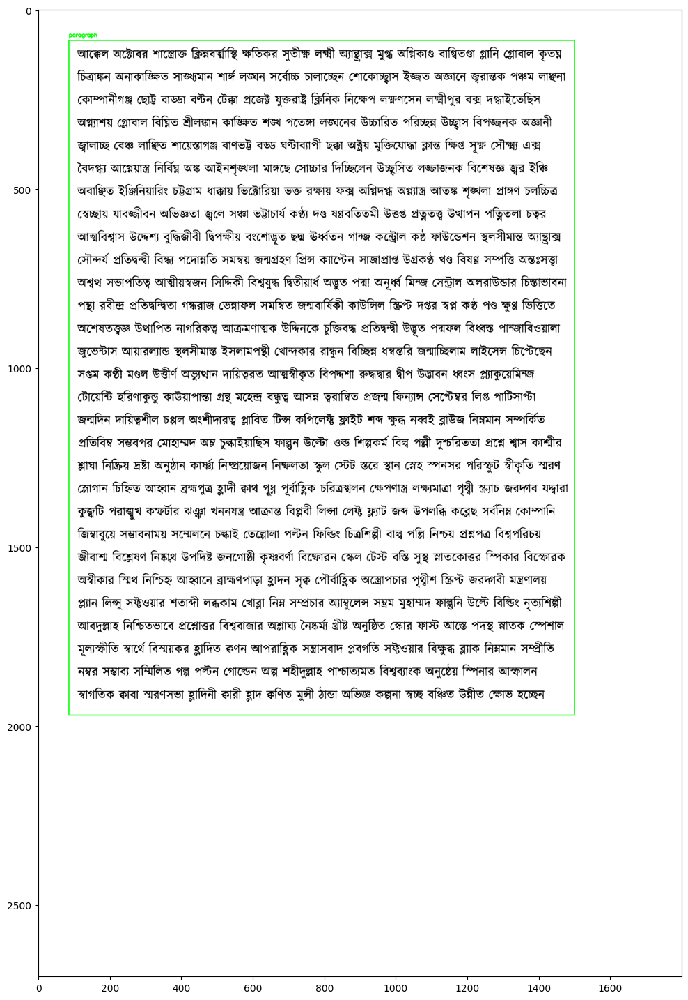

Success to load image at /kaggle/input/map-code-test-nov-14/mAP_test/RawImage/A2i91233-img-4e7a-bc22-82733e926851.png


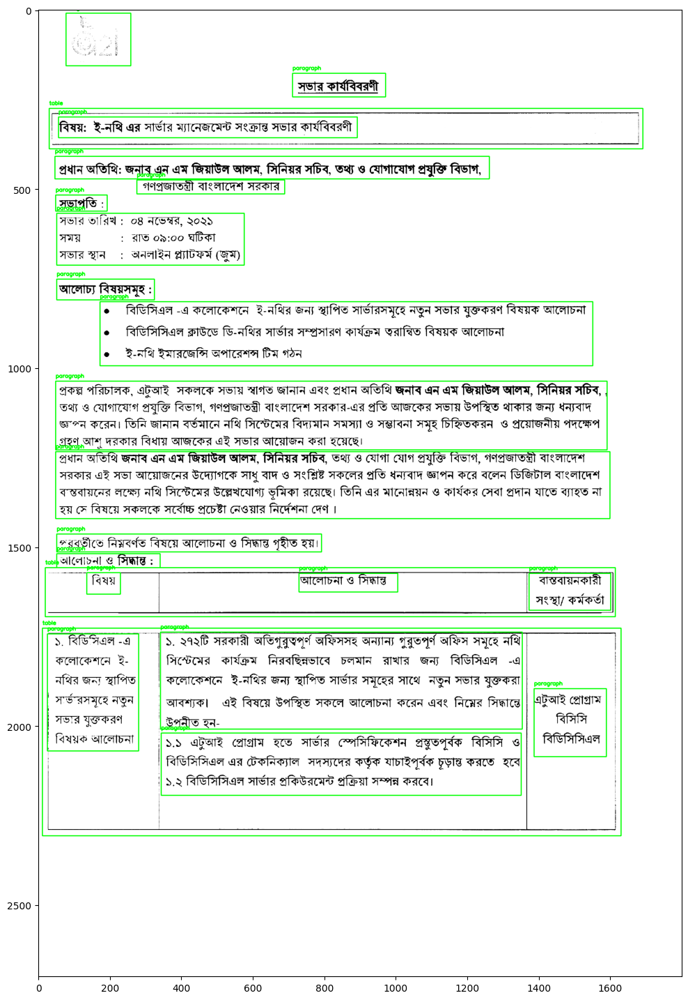

Success to load image at /kaggle/input/map-code-test-nov-14/mAP_test/RawImage/Page0044-img-4930-801c-fbd164235a1c.png


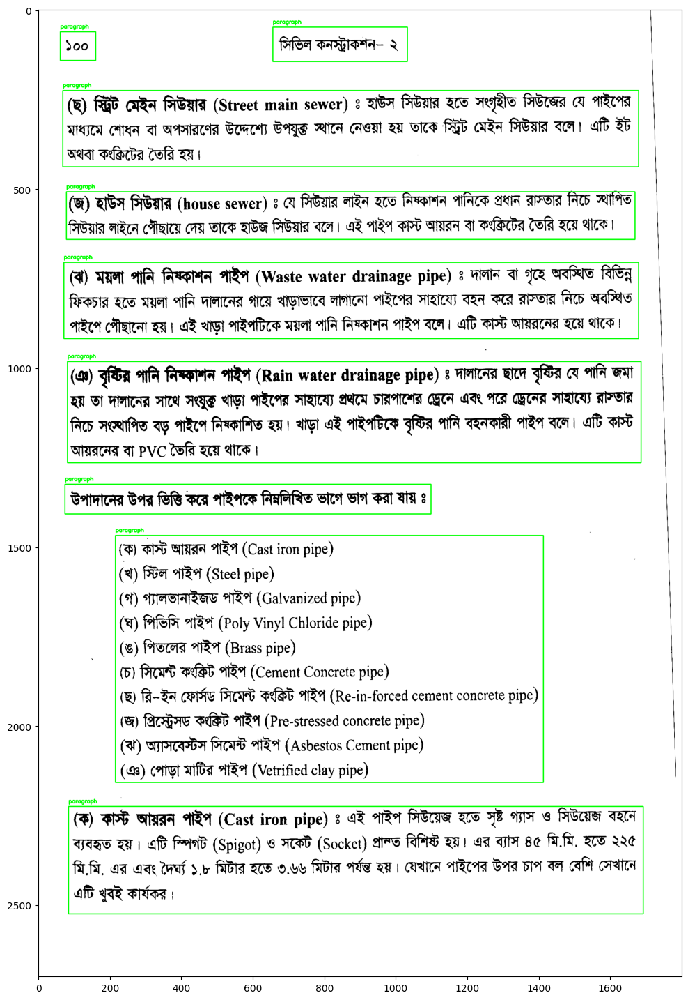

In [1]:
import json
import cv2
import os
from collections import defaultdict
from matplotlib import pyplot as plt

# Load the updated ground truth JSON file
with open('/kaggle/input/map-code-test-nov-14/mAP_test/AnnotatedLayout/annotations.coco.json') as f: 
    data = json.load(f)

# Extract the categories
categories = {category['id']: category['name'] for category in data['categories']}
# print(categories)


# Create a dictionary to store the annotations for each image
image_annotations = defaultdict(list)
for annotation in data['annotations']:
    image_id = annotation['image_id']
    image_annotations[image_id].append(annotation)
    
# print(image_annotations[0])
    
# Loop through the images and display each image with its annotations
for image_info in data['images']:
    image_id = image_info['id']
    image_filename = image_info['file_name']
#     image_filename = image_filename.replace('.png', '.jpg')
    
    # Load the images collected from OCR server which are jpg format instead of png
    image_path = os.path.join('/kaggle/input/map-code-test-nov-14/mAP_test/RawImage', image_filename)
    image = cv2.imread(image_path)

    if image is None:
#         print(f"Failed to load image at {image_path}")
        continue
    else:
        print(f"Success to load image at {image_path}")

    # Convert the image from BGR to RGB for display with matplotlib
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Draw the annotations on the image
    for annotation in image_annotations[image_id]:
        category_id = annotation['category_id']
        bbox = annotation['bbox']
        x, y, w, h = map(int, bbox)

        # Draw the bounding box
        cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)

        # Add the category label
        label = categories[category_id]
        cv2.putText(image, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Show the image using matplotlib
    plt.figure(figsize=(27,18))
    plt.imshow(image)
    plt.show()

In [2]:
import cv2
import numpy as np
import json
import os
from collections import defaultdict

In [3]:
'''PIPELINE for mAP Calculation'''

'PIPELINE for mAP Calculation'

In [4]:
'''Step 1. Generate predicted JSON files from Apurba OCR system'''

'Step 1. Generate predicted JSON files from Apurba OCR system'

In [5]:
'''Step 2. Rename all the predicted JSON files to its corresponding image filename as Apurba OCR changes the JSON filename'''

'Step 2. Rename all the predicted JSON files to its corresponding image filename as Apurba OCR changes the JSON filename'

# Visualizing Pipeline Layout 

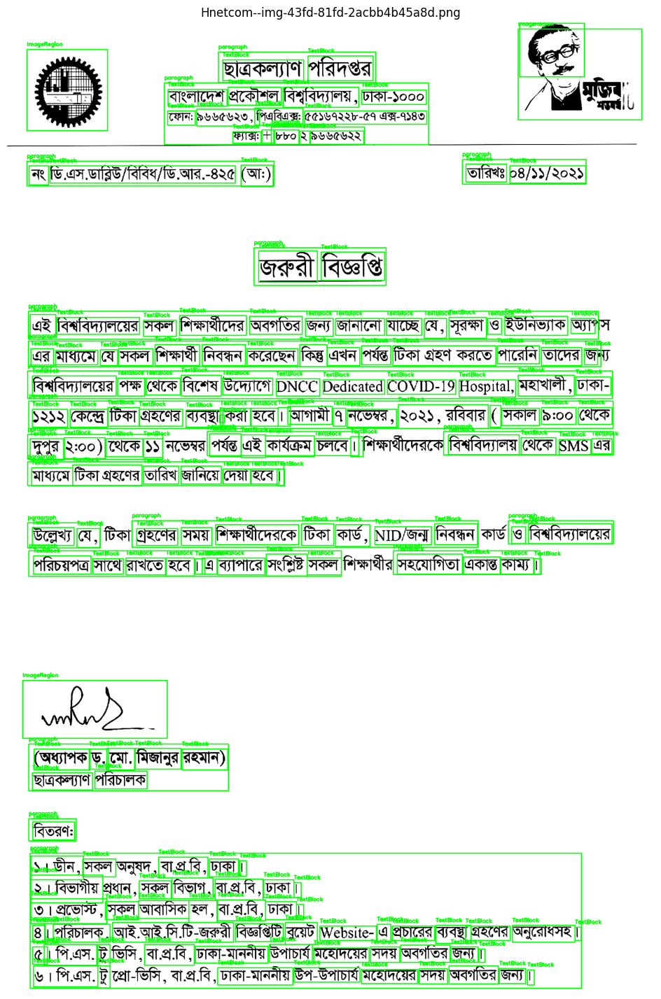

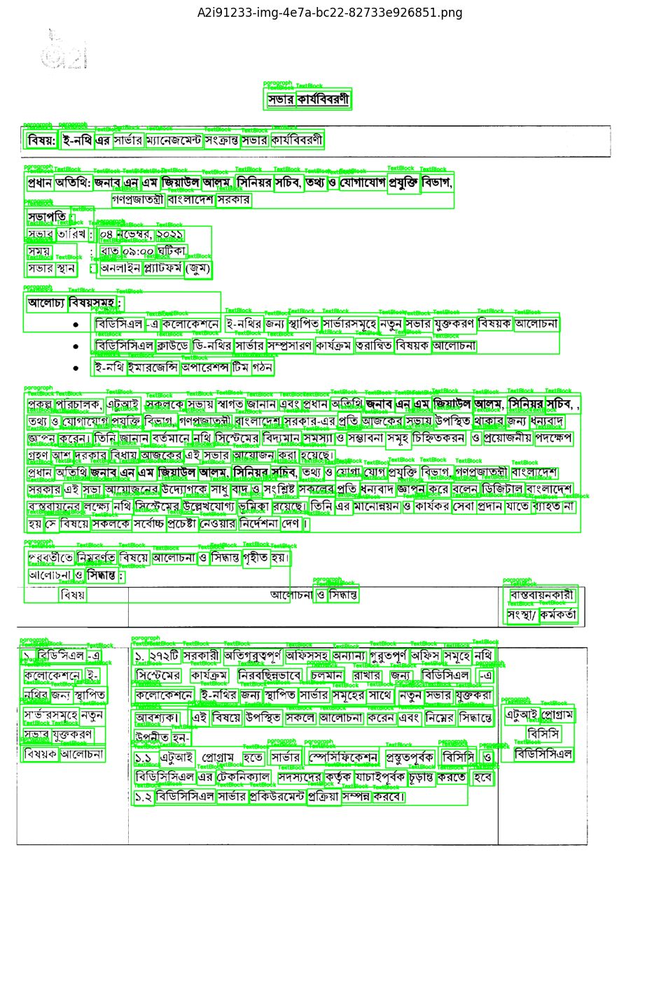

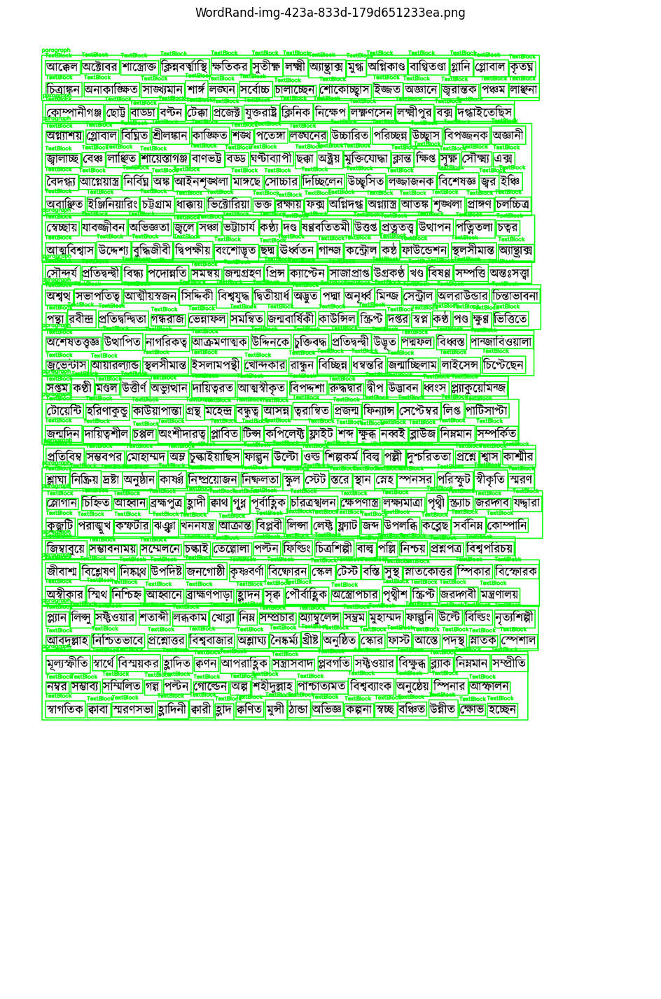

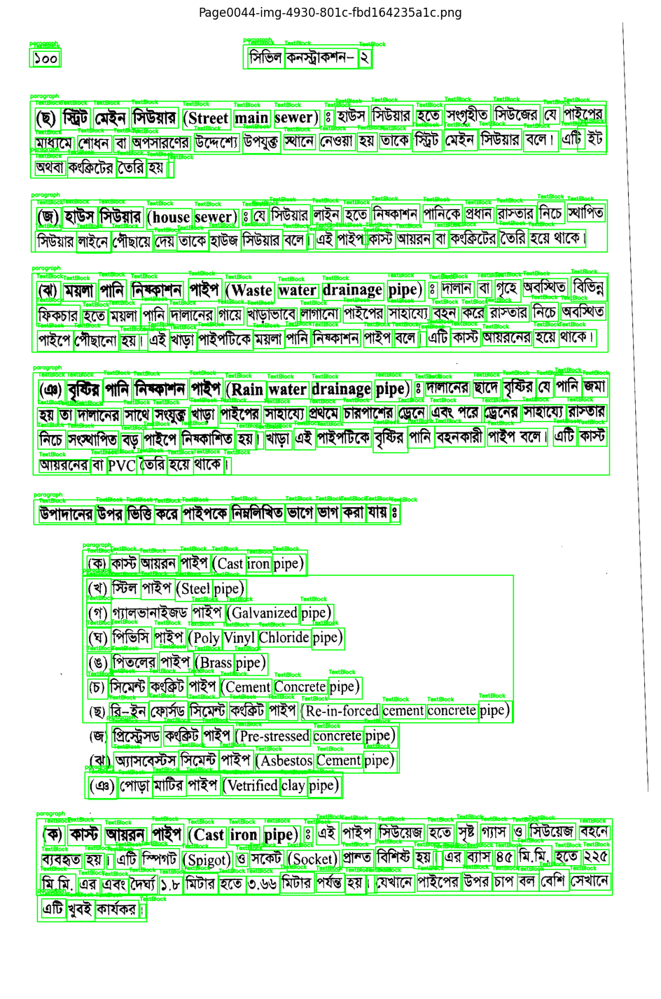

In [6]:
import json
import os
import cv2
from collections import defaultdict
from matplotlib import pyplot as plt

# Load the JSON file containing annotations
annotations_path = '/kaggle/input/map-code-test-nov-14/mAP_test/PipelineLayout'
annotations_files = [f for f in os.listdir(annotations_path) if f.endswith('.json')]

# Loop through the annotation files
for annotations_file in annotations_files:
    with open(os.path.join(annotations_path, annotations_file)) as f:
        annotations_data = json.load(f)
    
    image_filename = annotations_data['name']
    image_path = os.path.join('/kaggle/input/map-code-test-nov-14/mAP_test/RawImage', image_filename)
  
    image = cv2.imread(image_path)
#     # Resize the image to 1800x2700
#     image = cv2.resize(image, (1800, 2700))
    if image is None:
        print(f"Failed to load image at {image_path}")
        continue

    for segment_id, segment_info in annotations_data['segments'].items():
        points = segment_info['points']
        
        # Extract the rectangle coordinates
        x_min = int(min(point['x'] for point in points))
        y_min = int(min(point['y'] for point in points))
        x_max = int(max(point['x'] for point in points))
        y_max = int(max(point['y'] for point in points))
        
        category_label = segment_info['type']  # Get the category label
        
        # Draw the rectangle
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
        
        # Add the category label
        label_x = x_min  # x-coordinate of the bottom-left corner
        label_y = y_min - 10  # y-coordinate shifted upward for the label
        cv2.putText(image, category_label, (label_x, label_y),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Convert the image from BGR to RGB for display with matplotlib
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Show the image with annotations
    plt.figure(figsize=(27,18))
    plt.imshow(image)
    plt.title(image_filename)
    plt.axis('off')
    plt.show()

In [10]:
'''Step 3. Combine all the JSON files in 1 single JSON in COCO format as you will get 1 single predicted JSON for 1 image document and in another format'''

'Step 3. Combine all the JSON files in 1 single JSON in COCO format as you will get 1 single predicted JSON for 1 image document and in another format'

In [11]:
import json
import os

# Define the directory where the JSON files are located
directory = '/kaggle/input/map-code-test-nov-14/mAP_test/PipelineLayout'

# Create a new dictionary in COCO format
coco_dict = {
    "info": {
        "year": "2023",
        "version": "1",
        "description": "Converted to COCO json format using custom python script",
        "contributor": "Md. Mutasim Billah Abu Noman Akanda",
        "date_created": "11/14/2023"
    },
    "licenses": [],
    "categories": [
        {
            "id": 0,
            "name": "TextBlock"
        },
        {
            "id": 1,
            "name": "paragraph"
        },
        {
            "id": 2,
            "name": "TableRegion"
        },
        {
            "id": 3,
            "name": "ImageRegion"
        }
    ],
    "images": [],
    "annotations": [],
}

# Iterate through each JSON file in the directory
image_id = 0
segment_id = 0
for filename in os.listdir(directory):
    if filename.endswith('.json'):
        # Load the JSON file
        with open(os.path.join(directory, filename), 'r') as f:
            data = json.load(f)
#             print(data['name'])

        # Get image information and add to the COCO dictionary
        width = data['width']
        height = data['height']
        coco_dict['images'].append({
            "id": image_id,
            "file_name": filename.replace('.json', '.png'),
            "width": width,
            "height": height
        })

        # Iterate through the segments and add to the COCO dictionary
        for segment_key, segment_value in data['segments'].items():
#             print(segment_key)
            # Check if the category exists in the COCO dictionary
            category_id = None
            for cat in coco_dict['categories']:
                if cat['name'] == segment_value['type']:
                    category_id = cat['id']
                    break
            # If the category does not exist, add a new category to the COCO dictionary
            if category_id is None:
                category_id = len(coco_dict['categories'])
                coco_dict['categories'].append({
                    "id": category_id,
                    "name": segment_value['type']
                })
                
            points = segment_value['points']
            x_coords = [p['x'] for p in points]
            y_coords = [p['y'] for p in points]
            xmin, ymin = min(x_coords), min(y_coords)
            xmax, ymax = max(x_coords), max(y_coords)
#             print("xmin = ", xmin)
#             print("ymin = ", ymin)
#             print("xmax = ", xmax)
#             print("ymax = ", ymax)
            bbox = [
                xmin,
                ymin,
                xmax,
                ymax
            ]

            width = xmax - xmin
            height = ymax - ymin
            area = width * height

            coco_dict['annotations'].append({
                "id": segment_id,
                "image_id": image_id,
                "category_id": category_id,
                "bbox": bbox,
                "width" : width,
                "height" : height,
                "area": area,
                "iscrowd": 0
            })

            segment_id += 1

        image_id += 1

# Save the COCO dictionary as a JSON file
with open('converted_single-coco_format.json', 'w') as f:
    json.dump(coco_dict, f)

In [12]:
'''Step 4. Map between the ground truth and prediction JSON as category id, category name are different'''

'Step 4. Map between the ground truth and prediction JSON as category id, category name are different'

In [13]:
import json

# Load ground truth JSON file
with open('/kaggle/input/map-code-test-nov-14/mAP_test/AnnotatedLayout/annotations.coco.json') as f:
    ground_truth = json.load(f)

# Load prediction JSON file
with open('/kaggle/working/converted_single-coco_format.json') as f:
    prediction = json.load(f)

In [14]:
# Extract the category lists from both files
gt_categories = ground_truth['categories']
pred_categories = prediction['categories']
# print(pred_categories)
# print(type(pred_categories))

# Print the number and names of categories in both files
print(f"Number of categories in ground truth: {len(gt_categories)}")
print("Ground truth categories:")
for cat in gt_categories:
    print(f"  - {cat['name']}")

print(f"\nNumber of categories in predicted file: {len(pred_categories)}")
print("Predicted categories:")
for cat in pred_categories:
    print(f"  - {cat['name']}")

Number of categories in ground truth: 3
Ground truth categories:
  - image
  - paragraph
  - table

Number of categories in predicted file: 4
Predicted categories:
  - TextBlock
  - paragraph
  - TableRegion
  - ImageRegion


In [15]:
# category count in ground_truth

category_counts = {}
for bbox in ground_truth['annotations']:
    category_id = bbox['category_id']
    if category_id in category_counts:
        category_counts[category_id] += 1
    else:
        category_counts[category_id] = 1
print(category_counts)

{2: 4, 0: 39, 3: 3}


In [16]:
# category count in prediction

category_counts = {}
for bbox in prediction['annotations']:
    category_id = bbox['category_id']
    if category_id in category_counts:
        category_counts[category_id] += 1
    else:
        category_counts[category_id] = 1
print(category_counts)

{0: 1188, 3: 4, 1: 85}


In [17]:
# Modify the categories and category IDs
for category in prediction['categories']:
    if category['name'] == 'TextBlock':
        category['name'] = 'text_box'
        category['id'] = 1
    elif category['name'] == 'paragraph':
        category['name'] = 'paragraph'
        category['id'] = 0
    elif category['name'] == 'TableRegion':
        category['name'] = 'table'
        category['id'] = 3
    # Add a new category 'image'
    elif category['name'] == 'ImageRegion':
        category['name'] = 'image'
        category['id'] = 2

In [18]:
# Modify category_id in annotations dictionary

for annotation in prediction['annotations']:
    category_id = annotation['category_id']
    if category_id == 0:
        annotation['category_id'] = 1
    elif category_id == 1:
        annotation['category_id'] = 0
    elif category_id == 2:
        annotation['category_id'] = 3
    else:
        annotation['category_id'] = 2

In [19]:
# Save the updated prediction JSON file

with open('mapped_prediction.json', 'w') as f:
    json.dump(prediction, f, indent=4)

# Visualizing Mapped Prediction JSON

Success to load image at /kaggle/input/map-code-test-nov-14/mAP_test/RawImage/Hnetcom--img-43fd-81fd-2acbb4b45a8d.png


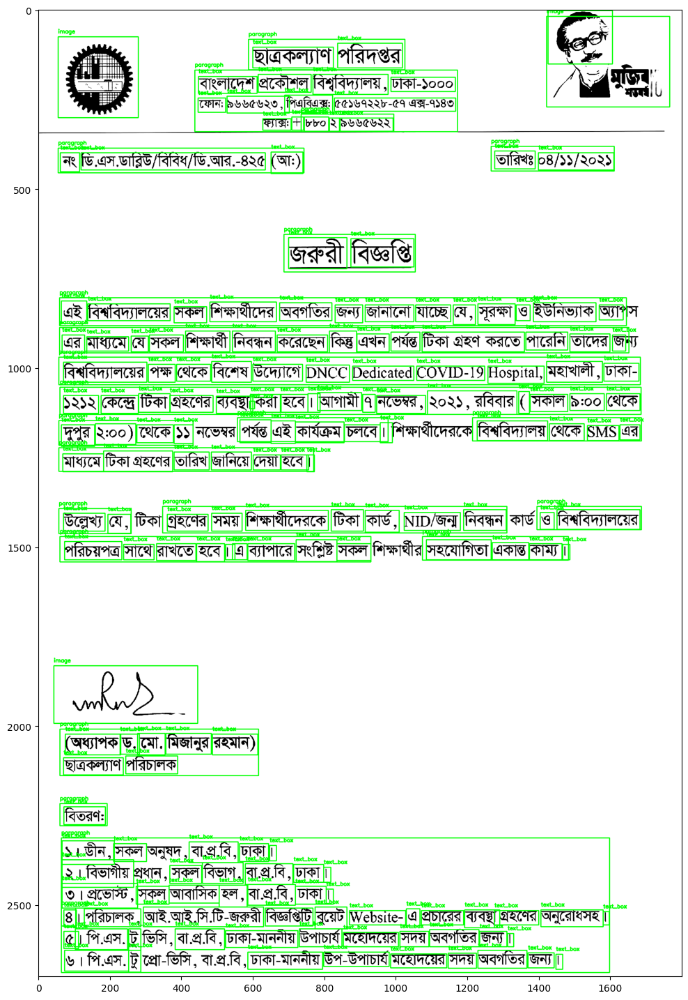

Success to load image at /kaggle/input/map-code-test-nov-14/mAP_test/RawImage/A2i91233-img-4e7a-bc22-82733e926851.png


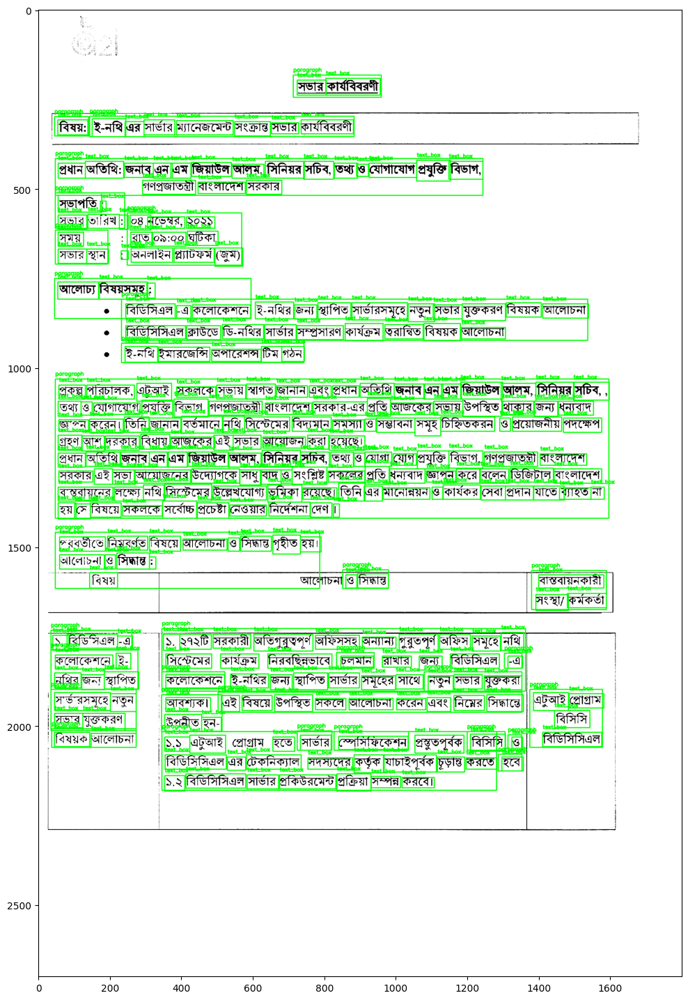

Success to load image at /kaggle/input/map-code-test-nov-14/mAP_test/RawImage/WordRand-img-423a-833d-179d651233ea.png


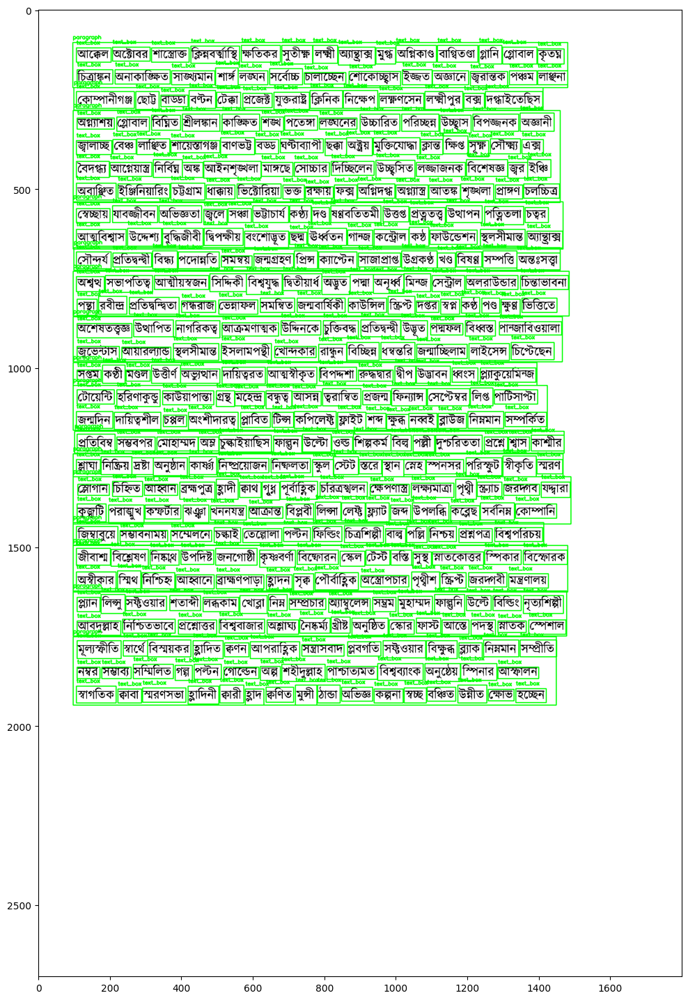

Success to load image at /kaggle/input/map-code-test-nov-14/mAP_test/RawImage/Page0044-img-4930-801c-fbd164235a1c.png


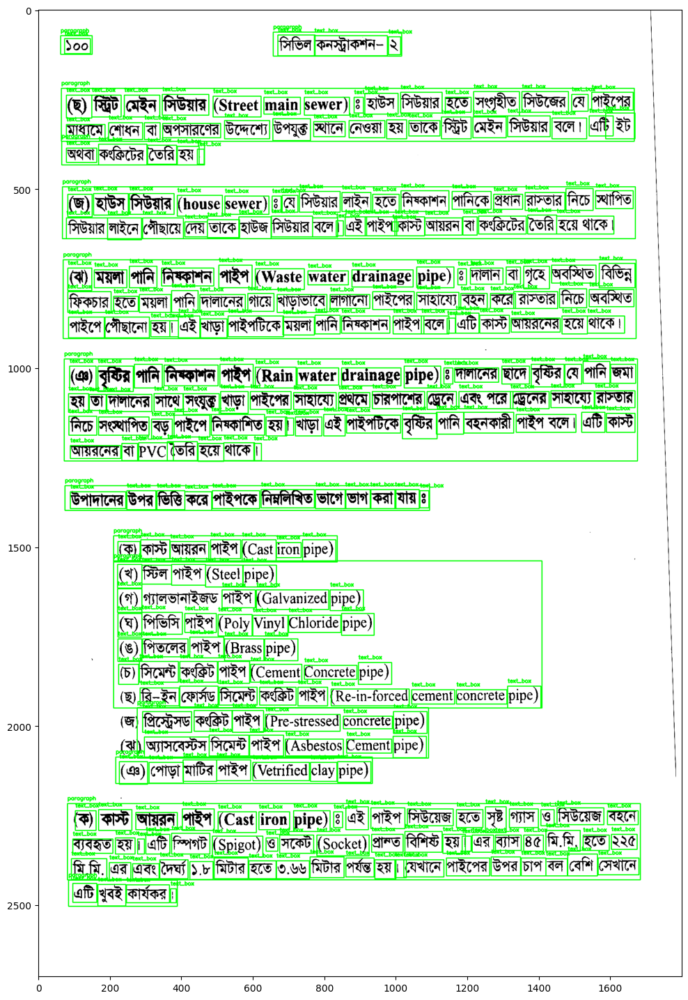

In [20]:
import json
import cv2
import os
from collections import defaultdict
from matplotlib import pyplot as plt

# Load the updated ground truth JSON file
with open('/kaggle/working/mapped_prediction.json') as f: 
    data = json.load(f)

# Extract the categories
categories = {category['id']: category['name'] for category in data['categories']}
# print(categories)


# Create a dictionary to store the annotations for each image
image_annotations = defaultdict(list)
for annotation in data['annotations']:
    image_id = annotation['image_id']
    image_annotations[image_id].append(annotation)
    
# print(image_annotations[0])
    
# Loop through the images and display each image with its annotations
for image_info in data['images']:
    image_id = image_info['id']
    image_filename = image_info['file_name']
#     image_filename = image_filename.replace('.png', '.jpg')
    
    # Load the images collected from OCR server which are jpg format instead of png
    image_path = os.path.join('/kaggle/input/map-code-test-nov-14/mAP_test/RawImage', image_filename)
    image = cv2.imread(image_path)

    if image is None:
#         print(f"Failed to load image at {image_path}")
        continue
    else:
        print(f"Success to load image at {image_path}")

    # Convert the image from BGR to RGB for display with matplotlib
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Draw the annotations on the image
    for annotation in image_annotations[image_id]:
        category_id = annotation['category_id']
        bbox = annotation['bbox']
        x, y, w, h = map(int, bbox)

        # Draw the bounding box
        cv2.rectangle(image, (x, y), (w, h), (0, 255, 0), 2)

        # Add the category label
        label = categories[category_id]
        cv2.putText(image, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Show the image using matplotlib
    plt.figure(figsize=(27,18))
    plt.imshow(image)
    plt.show()

In [21]:
# excluding text_box

import json

# Load the JSON data
with open('/kaggle/working/mapped_prediction.json') as f:
    data = json.load(f)

# Filter out annotations with category_id equal to 1
filtered_annotations = [annotation for annotation in data['annotations'] if annotation['category_id'] != 1]

# Update the annotations in the JSON data
data['annotations'] = filtered_annotations

# Save the updated JSON in the Kaggle working directory
output_path = '/kaggle/working/updated_annotations_for_3Labels.json'
with open(output_path, 'w') as f:
    json.dump(data, f, indent=4)

print("Annotations with category_id 1 removed and saved to:", output_path)

Annotations with category_id 1 removed and saved to: /kaggle/working/updated_annotations_for_3Labels.json


# Visualizing 3 Labels Mapped JSON

Success to load image at /kaggle/input/map-code-test-nov-14/mAP_test/RawImage/Hnetcom--img-43fd-81fd-2acbb4b45a8d.png


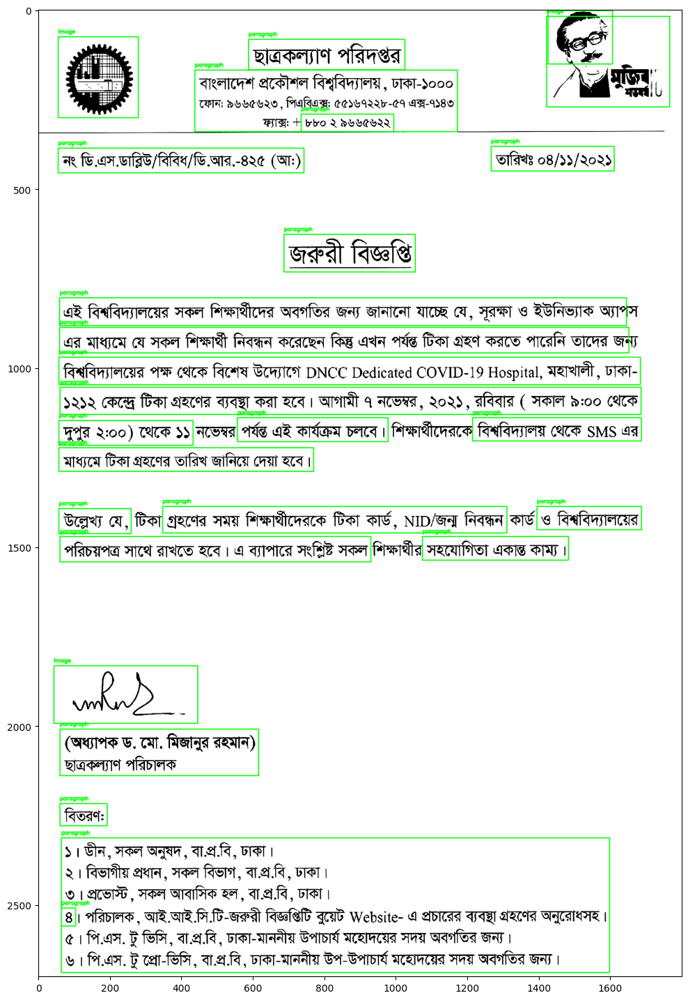

Success to load image at /kaggle/input/map-code-test-nov-14/mAP_test/RawImage/A2i91233-img-4e7a-bc22-82733e926851.png


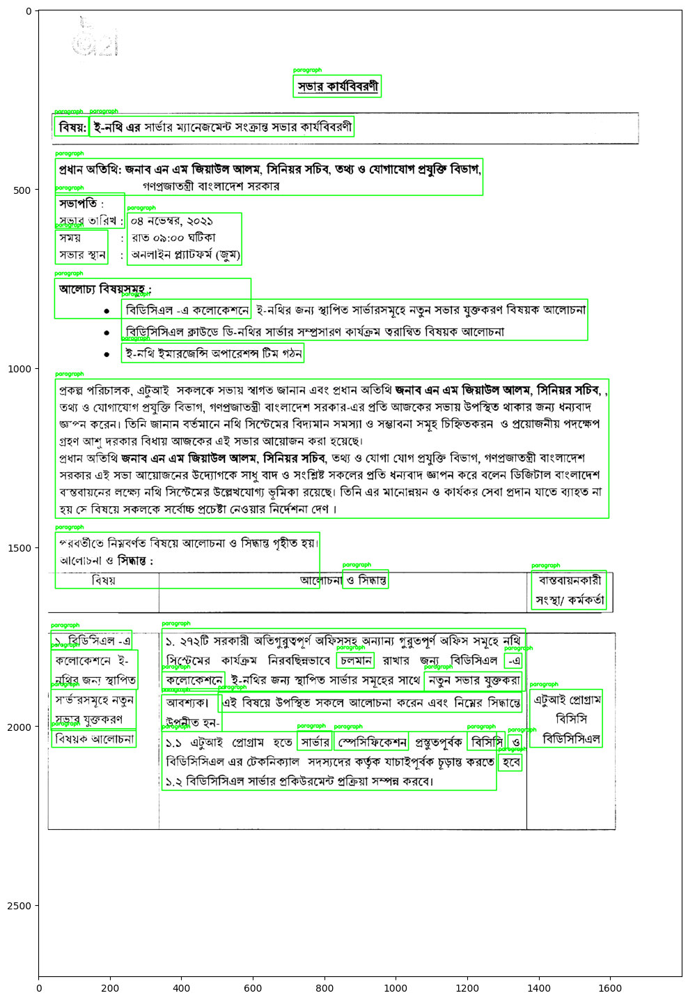

Success to load image at /kaggle/input/map-code-test-nov-14/mAP_test/RawImage/WordRand-img-423a-833d-179d651233ea.png


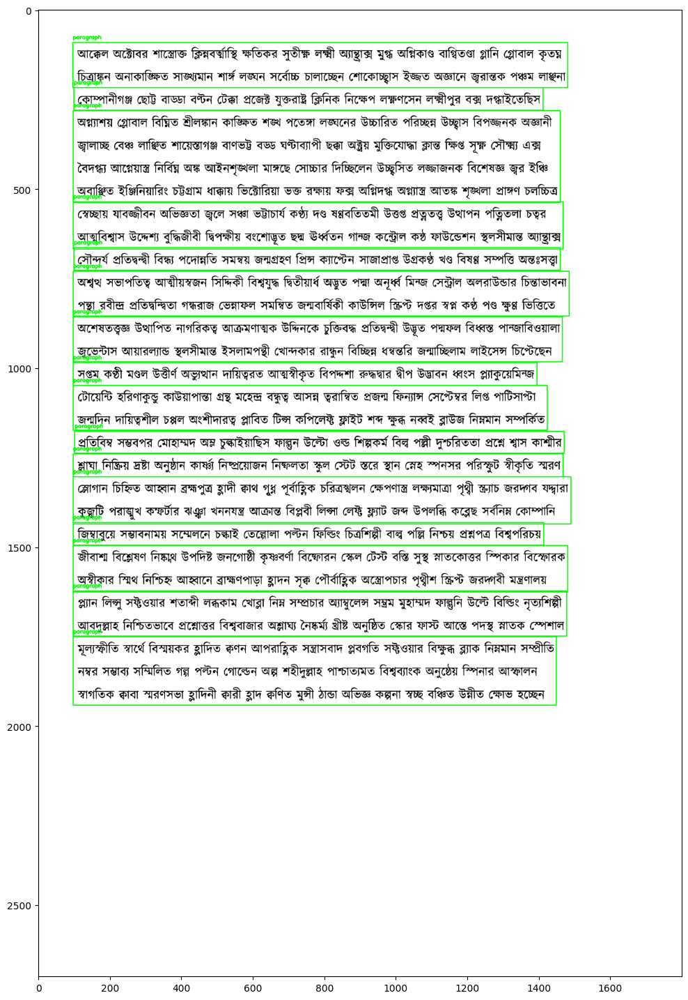

Success to load image at /kaggle/input/map-code-test-nov-14/mAP_test/RawImage/Page0044-img-4930-801c-fbd164235a1c.png


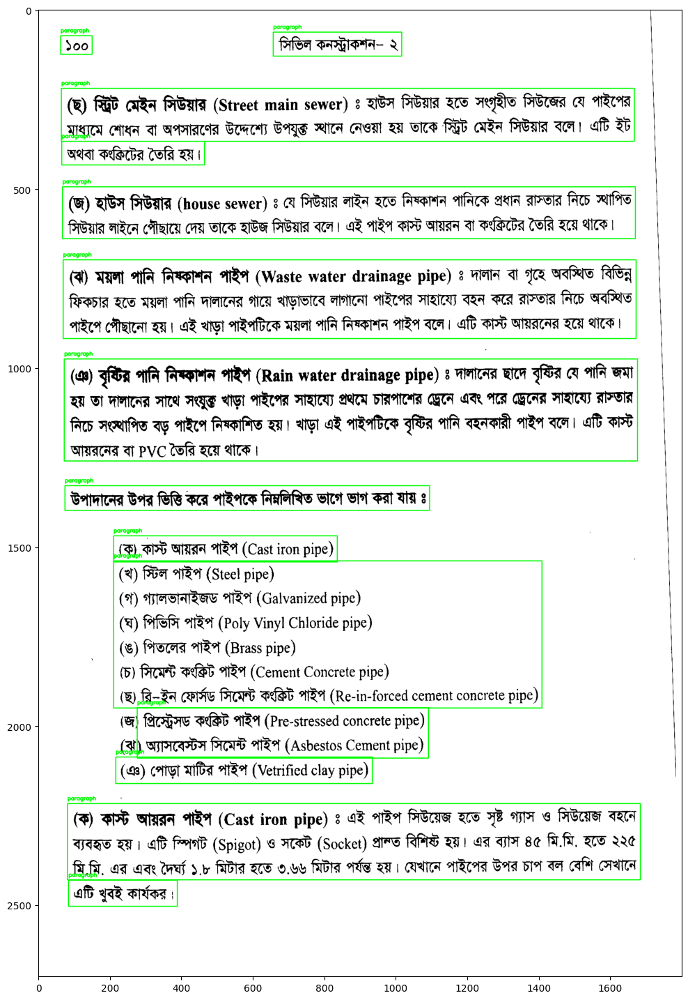

In [22]:
import json
import cv2
import os
from collections import defaultdict
from matplotlib import pyplot as plt

# # Load the JSON file
# with open('/kaggle/working/mapped_prediction.json') as f:
#     data = json.load(f)
    
# Load the JSON file
with open('/kaggle/working/updated_annotations_for_3Labels.json') as f:
    data = json.load(f)

# Extract the categories
categories = {category['id']: category['name'] for category in data['categories']}

# Create a dictionary to store the annotations for each image
image_annotations = defaultdict(list)
for annotation in data['annotations']:
    image_id = annotation['image_id']
    image_annotations[image_id].append(annotation)

# Loop through the images and display each image with its annotations
for image_info in data['images']:
    image_id = image_info['id']
    image_filename = image_info['file_name']
#     image_filename = image_filename.replace('.png', '.jpg')
#     image_path = os.path.join('/kaggle/input/updated-images-noise-removed/updated-images-noise-removed', image_filename)
    image_path = os.path.join('/kaggle/input/map-code-test-nov-14/mAP_test/RawImage', image_filename)
    image = cv2.imread(image_path)
#     # Resize the image to 1700x2800
#     image = cv2.resize(image, (1800, 2700))
#     print('Dimensions after resizing: ',img.shape)

    if image is None:
#         print(f"Failed to load image at {image_path}")
        continue
    else:
        print(f"Success to load image at {image_path}")

    # Convert the image from BGR to RGB for display with matplotlib
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Draw the annotations on the image
    for annotation in image_annotations[image_id]:
        category_id = annotation['category_id']
        bbox = annotation['bbox']
        xmin, ymin, xmax, ymax = map(int, bbox)

        # Draw the bounding box
        cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)

        # Add the category label
        label = categories[category_id]
        cv2.putText(image, label, (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Show the image using matplotlib
    plt.figure(figsize=(27,18))
    plt.imshow(image)
    plt.show()

In [23]:
"""Update on 1 September"""

import json
import cv2
import os
from collections import defaultdict

# Load the JSON file
with open('/kaggle/working/updated_annotations_for_3Labels.json') as f:
    data = json.load(f)

# Extract the categories
categories = {category['id']: category['name'] for category in data['categories']}

# Create a dictionary to store the annotations for each image
image_annotations = defaultdict(list)
for annotation in data['annotations']:
    image_id = annotation['image_id']
    image_annotations[image_id].append(annotation)

# Set the output directory for saving images
output_dir = '/kaggle/working/'
os.makedirs(output_dir, exist_ok=True)

# Loop through the images and save each image with its annotations
for image_info in data['images']:
    image_id = image_info['id']
    image_filename = image_info['file_name']
    image_path = os.path.join('/kaggle/input/map-code-test-nov-14/mAP_test/RawImage', image_filename)
    image = cv2.imread(image_path)

    if image is None:
        continue

    # Resize the image to 1800x2700
    image = cv2.resize(image, (1800, 2700))

    # Draw the annotations on the image
    for annotation in image_annotations[image_id]:
        category_id = annotation['category_id']
        bbox = annotation['bbox']
        xmin, ymin, xmax, ymax = map(int, bbox)

        # Draw the bounding box
        cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)

        # Add the category label
        label = categories[category_id]
        cv2.putText(image, label, (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    
    # Save the image with bounding boxes
    output_path = os.path.join(output_dir, image_filename)
    cv2.imwrite(output_path, image)

print("Images with bounding boxes saved in:", output_dir)

Images with bounding boxes saved in: /kaggle/working/


In [24]:
'''Step 5. Calculate mAP comparing ground truth and predictions'''

'Step 5. Calculate mAP comparing ground truth and predictions'

In [25]:
# writing method for loading json file
import json

def load_json(file_path):
    with open(file_path, 'r') as f:
        data = json.load(f)
    return data

In [26]:
# loading ground truth JSON
gt_file_path = '/kaggle/input/json-3labels-gt-pt-24-nov-updated-v2/json-3labels-gt-pt-24-Nov-updated/annotations.coco.json'
ground_truth = load_json(gt_file_path)

# # loading mapped prediction JSON
# pred_file_path = '/kaggle/input/json-3labels-gt-pt-1sep/JSON-3Labels-GT-PT/updated_annotations_for_3Labels.json'
# predictions = load_json(pred_file_path)

# loading mapped prediction JSON
pred_file_path = '/kaggle/input/json-3labels-gt-pt-24-nov-updated-v2/json-3labels-gt-pt-24-Nov-updated/updated_annotations_for_3Labels.json'
predictions = load_json(pred_file_path)

In [27]:
category_counts = {}

for bbox in ground_truth['annotations']:
    image_id = bbox['image_id']
    category_id = bbox['category_id']

    # Create a nested dictionary for each image_id if not exists
    if image_id not in category_counts:
        category_counts[image_id] = {}

    # Count category occurrences for each image_id
    if category_id in category_counts[image_id]:
        category_counts[image_id][category_id] += 1
    else:
        category_counts[image_id][category_id] = 1

# Print the result for each image_id
for image_id, counts in category_counts.items():
    print(f"Image ID: {image_id}, Category Counts: {counts}")

Image ID: 0, Category Counts: {2: 3, 0: 10}
Image ID: 1, Category Counts: {0: 1}
Image ID: 2, Category Counts: {2: 1, 0: 19, 3: 3}
Image ID: 3, Category Counts: {0: 9}


In [28]:
# category count in groundtruth

category_counts = {}
for bbox in ground_truth['annotations']:
    category_id = bbox['category_id']
    if category_id in category_counts:
        category_counts[category_id] += 1
    else:
        category_counts[category_id] = 1
print(category_counts)

{2: 4, 0: 39, 3: 3}


In [29]:
category_counts = {}

for bbox in predictions['annotations']:
    image_id = bbox['image_id']
    category_id = bbox['category_id']

    # Create a nested dictionary for each image_id if not exists
    if image_id not in category_counts:
        category_counts[image_id] = {}

    # Count category occurrences for each image_id
    if category_id in category_counts[image_id]:
        category_counts[image_id][category_id] += 1
    else:
        category_counts[image_id][category_id] = 1

# Print the result for each image_id
for image_id, counts in category_counts.items():
    print(f"Image ID: {image_id}, Category Counts: {counts}")

Image ID: 0, Category Counts: {2: 4, 0: 23}
Image ID: 2, Category Counts: {0: 32}
Image ID: 1, Category Counts: {0: 16}
Image ID: 3, Category Counts: {0: 14}


In [30]:
# category count in prediction

category_counts = {}
for bbox in predictions['annotations']:
    category_id = bbox['category_id']
    if category_id in category_counts:
        category_counts[category_id] += 1
    else:
        category_counts[category_id] = 1
print(category_counts)

{2: 4, 0: 85}


In [31]:
print(list(ground_truth['annotations'][2]['bbox']))

[585, 87, 450.18, 77.3]


In [32]:
# Extract the category lists from both files
gt_categories = ground_truth['categories']
pred_categories = predictions['categories']

# Print the number and names of categories in both files
print(f"Number of categories in ground truth: {len(gt_categories)}")
print("Ground truth categories:")
for cat in gt_categories:
    print(f"  - {cat['name']}")

print(f"\nNumber of categories in predicted file: {len(pred_categories)}")
print("Predicted file categories:")
for cat in pred_categories:
    print(f"  - {cat['name']}")

Number of categories in ground truth: 3
Ground truth categories:
  - image
  - paragraph
  - table

Number of categories in predicted file: 4
Predicted file categories:
  - text_box
  - paragraph
  - table
  - image


In [33]:
import itertools
import matplotlib.pyplot as plt
import numpy as np

In [34]:
# # testing mAP for same JSON

# import itertools
# import numpy as np
# import json

# def calculate_iou(gt_box, pred_box):
#     inter_box_top_left = [max(gt_box[0], pred_box[0]), max(gt_box[1], pred_box[1])]
#     inter_box_bottom_right = [min(gt_box[0]+gt_box[2], pred_box[0]+pred_box[2]), min(gt_box[1]+gt_box[3], pred_box[1]+pred_box[3])]

#     inter_box_w = inter_box_bottom_right[0] - inter_box_top_left[0]
#     inter_box_h = inter_box_bottom_right[1] - inter_box_top_left[1]

#     intersection = inter_box_w * inter_box_h
#     union = gt_box[2] * gt_box[3] + pred_box[2] * pred_box[3] - intersection
    
#     iou = intersection / union
# #     print("iou : ", iou)

#     return iou

# def extract_bounding_box_info(json_file, gt_or_pt):
#     with open(json_file, 'r') as f:
#         json_data = json.load(f)
        
#     bbox_info = []
#     if gt_or_pt == "gt":
#         for ann in json_data['annotations']:
#             bbox = ann['bbox']
#             bbox_info.append({
#                 'image_id': ann['image_id'],
# #                 'bbox': [bbox[0], bbox[1], bbox[0] + bbox[2], bbox[1] + bbox[3]],
#                 'bbox': [bbox[0], bbox[1], bbox[2], bbox[3]],
#                 'category_id': ann['category_id']
#             })
#     else:
#         for ann in json_data['annotations']:
#             bbox = ann['bbox']
#             bbox_info.append({
#                 'image_id': ann['image_id'],
#                 'bbox': [bbox[0], bbox[1], bbox[2], bbox[3]],
# #                 'bbox': [bbox[0], bbox[1], bbox[2] - bbox[0], bbox[3] - bbox[1]],
# #                 'bbox': [bbox[0], bbox[1], bbox[0] + bbox[2], bbox[1] + bbox[3]],
#                 'category_id': ann['category_id']
#             })
#     return bbox_info

# # def scale_mAP(mAP, min_mAP=0.0, max_mAP=0.67, desired_min=0.0, desired_max=1.0):
# #     scaled_mAP = ((mAP - min_mAP) / (max_mAP - min_mAP)) * (desired_max - desired_min) + desired_min
# #     return scaled_mAP

# def calculate_image_mAP(gt_bboxes, pred_bboxes, image_id, iou_threshold=0.5):
#     num_classes = len(set([bbox['category_id'] for bbox in gt_bboxes]))
#     ap_sum = 0
#     for class_id in range(num_classes):
#         class_gt_bboxes = [bbox for bbox in gt_bboxes if bbox['category_id'] == class_id and bbox['image_id'] == image_id]
#         class_pred_bboxes = [bbox for bbox in pred_bboxes if bbox['category_id'] == class_id and bbox['image_id'] == image_id]
        
#         if len(class_gt_bboxes) == 0 or len(class_pred_bboxes) == 0:
#             continue
        
#         sorted_pairs = sorted([(i, j, calculate_iou(gt_bbox['bbox'], pred_bbox['bbox']))
#                                for i, gt_bbox in enumerate(class_gt_bboxes)
#                                for j, pred_bbox in enumerate(class_pred_bboxes)],
#                               key=lambda x: x[2], reverse=True)
#         precision = []
#         recall = []
#         used_pred_indices = set()
#         for i, j, iou in sorted_pairs:
#             if iou >= iou_threshold and j not in used_pred_indices:
#                 used_pred_indices.add(j)
#                 tp = len(used_pred_indices)
#                 fp = len(class_pred_bboxes) - tp
#                 fn = len(class_gt_bboxes) - tp
#                 precision.append(tp / (tp + fp))
#                 recall.append(tp / (tp + fn))
#         for i in range(len(precision) - 2, -1, -1):
#             precision[i] = max(precision[i], precision[i+1])
#         ap = 0
#         for i in range(len(precision)):
#             if i == 0:
#                 delta_recall = recall[i]
#             else:
#                 # average precision (AP) using the trapezoidal rule to compute the area under the precision-recall curve
#                 delta_recall = recall[i] - recall[i-1]
#             ap += precision[i] * delta_recall
#         ap_sum += ap
#     mAP = ap_sum / num_classes
# #     mAP = scale_mAP(mAP)
    
#     return mAP

# # Calling all the methods

# # File paths for ground truth and prediction JSON files
# gt_file_path = "/kaggle/input/json-3labels-gt-pt-14-nov/json-3labels-gt-pt-14-Nov/annotations.coco.json"
# pred_file_path = "/kaggle/input/json-3labels-gt-pt-14-nov/json-3labels-gt-pt-14-Nov/annotations.coco.json"

# # Load ground truth and prediction bounding box information
# ground_truth_bboxes = extract_bounding_box_info(gt_file_path, "gt") # bbox = [x, y, w, h]
# prediction_bboxes = extract_bounding_box_info(pred_file_path, "pt") # bbox = [x, y, w, h]

# image_ids = set([bbox['image_id'] for bbox in ground_truth_bboxes])
# image_mAPs = {}

# for image_id in image_ids:
#     image_mAP = calculate_image_mAP(ground_truth_bboxes, prediction_bboxes, image_id, iou_threshold=0.5)
#     image_mAPs[image_id] = image_mAP

# # Calculate mean of individual image mAPs
# mean_image_mAP = sum(image_mAPs.values()) / len(image_mAPs)
# print("Mean mAP for each image:")
# for image_id, mAP in image_mAPs.items():
#     print(f"Image ID: {image_id}, mAP: {mAP}")

# print("Mean mAP across all images:", mean_image_mAP)

# mAP Code Test-11-October

In [35]:
# Scaled-mAP

import itertools
import numpy as np
import json

def calculate_iou(gt_box, pred_box):
    inter_box_top_left = [max(gt_box[0], pred_box[0]), max(gt_box[1], pred_box[1])]
    inter_box_bottom_right = [min(gt_box[0]+gt_box[2], pred_box[0]+pred_box[2]), min(gt_box[1]+gt_box[3], pred_box[1]+pred_box[3])]

    inter_box_w = inter_box_bottom_right[0] - inter_box_top_left[0]
    inter_box_h = inter_box_bottom_right[1] - inter_box_top_left[1]

    intersection = inter_box_w * inter_box_h
    union = gt_box[2] * gt_box[3] + pred_box[2] * pred_box[3] - intersection
    
    iou = intersection / union
#     print("iou : ", iou)

    return iou

def extract_bounding_box_info(json_file, gt_or_pt):
    with open(json_file, 'r') as f:
        json_data = json.load(f)
        
    bbox_info = []
    if gt_or_pt == "gt":
        for ann in json_data['annotations']:
            bbox = ann['bbox']
            bbox_info.append({
                'image_id': ann['image_id'],
#                 'bbox': [bbox[0], bbox[1], bbox[0] + bbox[2], bbox[1] + bbox[3]],
                'bbox': [bbox[0], bbox[1], bbox[2], bbox[3]],
                'category_id': ann['category_id']
            })
    else:
        for ann in json_data['annotations']:
            bbox = ann['bbox']
            bbox_info.append({
                'image_id': ann['image_id'],
                'bbox': [bbox[0], bbox[1], bbox[2] - bbox[0], bbox[3] - bbox[1]],
#                 'bbox': [bbox[0], bbox[1], bbox[0] + bbox[2], bbox[1] + bbox[3]],
                'category_id': ann['category_id']
            })
    return bbox_info

def scale_mAP(mAP, min_mAP=0.0, max_mAP=0.67, desired_min=0.0, desired_max=1.0):
    scaled_mAP = ((mAP - min_mAP) / (max_mAP - min_mAP)) * (desired_max - desired_min) + desired_min
    if scaled_mAP > 1:
        return 1
    return scaled_mAP

def calculate_image_mAP(gt_bboxes, pred_bboxes, image_id, iou_threshold=0.5):
    num_classes = len(set([bbox['category_id'] for bbox in gt_bboxes]))
#     print("num_classes = ", num_classes)


    # Mapping dictionary for image_id to num_classes
    image_id_to_num_classes = {0: 2, 1: 1, 2: 3, 3: 1}

#     # Mapping dictionary for image_id to num_classes
#     image_id_to_num_classes = {0: 1, 1: 1, 2: 3, 3: 2, 4 : 2, 5: 3, 6: 2, 7: 2, 8: 2, 9: 2}

    # Get num_classes based on image_id
    num_of_classes = image_id_to_num_classes.get(image_id, 0)
    
    print("Image_id = {}, num_of_classes = {}".format(image_id, num_of_classes))
    
    ap_sum = 0
    for class_id in range(num_classes):
        class_gt_bboxes = [bbox for bbox in gt_bboxes if bbox['category_id'] == class_id and bbox['image_id'] == image_id]
        class_pred_bboxes = [bbox for bbox in pred_bboxes if bbox['category_id'] == class_id and bbox['image_id'] == image_id]
        
        if len(class_gt_bboxes) == 0 or len(class_pred_bboxes) == 0:
            continue
        
#         sorted_pairs = sorted([(i, j, calculate_iou(gt_bbox['bbox'], pred_bbox['bbox']))
#                                for i, gt_bbox in enumerate(class_gt_bboxes)
#                                for j, pred_bbox in enumerate(class_pred_bboxes)],
#                               key=lambda x: x[2], reverse=False)

        sorted_pairs = sorted([(i, j, calculate_iou(gt_bbox['bbox'], pred_bbox['bbox']))
                               for i, gt_bbox in enumerate(class_gt_bboxes)
                               for j, pred_bbox in enumerate(class_pred_bboxes)], reverse=True)

        
        precision = []
        recall = []
        used_pred_indices = set()
        for i, j, iou in sorted_pairs:
            if iou >= iou_threshold and j not in used_pred_indices:
                used_pred_indices.add(j)
                tp = len(used_pred_indices)
                fp = len(class_pred_bboxes) - tp
                fn = len(class_gt_bboxes) - tp
                precision.append(tp / (tp + fp))
                recall.append(tp / (tp + fn))
        for i in range(len(precision) - 2, -1, -1):
            precision[i] = max(precision[i], precision[i+1])
        ap = 0
        for i in range(len(precision)):
            if i == 0:
                delta_recall = recall[i]
            else:
                # average precision (AP) using the trapezoidal rule to compute the area under the precision-recall curve
                delta_recall = recall[i] - recall[i-1]
            ap += precision[i] * delta_recall
        ap_sum += ap
    mAP = ap_sum / num_of_classes
    mAP = scale_mAP(mAP)
    
    return mAP

# Calling all the methods

# File paths for ground truth and prediction JSON files
gt_file_path = "/kaggle/input/json-3labels-gt-pt-24-nov-updated-v2/json-3labels-gt-pt-24-Nov-updated/annotations.coco.json"
# pred_file_path = "/kaggle/input/json-3labels-gt-pt-14-nov/json-3labels-gt-pt-14-Nov/updated_annotations_for_3Labels.json"
pred_file_path = "/kaggle/input/json-3labels-gt-pt-24-nov-updated-v2/json-3labels-gt-pt-24-Nov-updated/updated_annotations_for_3Labels.json"

# Load ground truth and prediction bounding box information
ground_truth_bboxes = extract_bounding_box_info(gt_file_path, "gt") # bbox = [x, y, w, h]
prediction_bboxes = extract_bounding_box_info(pred_file_path, "pt") # bbox = [x, y, w, h]

image_ids = set([bbox['image_id'] for bbox in ground_truth_bboxes])
image_mAPs = {}

for image_id in image_ids:
    image_mAP = calculate_image_mAP(ground_truth_bboxes, prediction_bboxes, image_id, iou_threshold=0.5)
    image_mAPs[image_id] = image_mAP

# Calculate mean of individual image mAPs
mean_image_mAP = sum(image_mAPs.values()) / len(image_mAPs)
print("Mean mAP for each image:")
for image_id, mAP in image_mAPs.items():
    print(f"Image ID: {image_id}, mAP: {mAP}")

print("Mean mAP across all images:", mean_image_mAP)

# Previous Output
# Image_id = 0, num_of_classes = 2
# Image_id = 1, num_of_classes = 1
# Image_id = 2, num_of_classes = 3
# Image_id = 3, num_of_classes = 1
# Mean mAP for each image:
# Image ID: 0, mAP: 0.8841661258922776
# Image ID: 1, mAP: 0.0
# Image ID: 2, mAP: 0.5114231474207908
# Image ID: 3, mAP: 1
# Mean mAP across all images: 0.5988973183282671

# Updated_after_solving_vertical_segmentation
# Image_id = 0, num_of_classes = 2
# Image_id = 1, num_of_classes = 1
# Image_id = 2, num_of_classes = 3
# Image_id = 3, num_of_classes = 1
# Mean mAP for each image:
# Image ID: 0, mAP: 0.8841661258922776
# Image ID: 1, mAP: 1
# Image ID: 2, mAP: 0.5531552762503271
# Image ID: 3, mAP: 1
# Mean mAP across all images: 0.8593303505356511

Image_id = 0, num_of_classes = 2
Image_id = 1, num_of_classes = 1
Image_id = 2, num_of_classes = 3
Image_id = 3, num_of_classes = 1
Mean mAP for each image:
Image ID: 0, mAP: 0.8841661258922776
Image ID: 1, mAP: 0.0
Image ID: 2, mAP: 0.5114231474207908
Image ID: 3, mAP: 1
Mean mAP across all images: 0.5988973183282671


# Code for solving SEGMENTATION issue in JSON

In [36]:
import json

# Load the JSON file
json_file_path = "/kaggle/input/json-3labels-gt-pt-24-nov-updated-v2/json-3labels-gt-pt-24-Nov-updated/updated_annotations_for_3Labels.json"

with open(json_file_path, 'r') as file:
    data = json.load(file)
    
flag = False

# Function to check and update annotations
def process_annotations(annotations):
    global flag
    
    # Sort annotations based on ymin
    annotations.sort(key=lambda x: x['bbox'][1])
#     print("annotations = ", annotations)
    
    updated_annotations = []
    i = 0
    
#     [{'id': 946, 'image_id': 2, 'category_id': 0, 'bbox': [96.0, 91.0, 1479.0, 217.0]
#      {'id': 938, 'image_id': 2, 'category_id': 0, 'bbox': [99.0, 217.0, 1410.0, 280.0]
#      {'id': 951, 'image_id': 2, 'category_id': 0, 'bbox': [97.0, 281.0, 1458.0, 538.0]

    while i < len(annotations):
        current_annotation = annotations[i]
        if flag == True:
            current_annotation = updated_annotations[-1]
#             print("current_annotation for flag = ", current_annotation)
#         print("flag outside version 1 = ", flag)
        flag = False
#         print("flag outside version 2 = ", flag)
#         print("current_annotation = ", current_annotation)

        # Check if there is another annotation to compare
        if i + 1 < len(annotations):
            next_annotation = annotations[i + 1]
#             print("next_annotation = ", next_annotation)

            # Calculate the differences
            ymin_diff = abs(next_annotation['bbox'][1] - current_annotation['bbox'][3])
            xmax_diff = abs(next_annotation['bbox'][2] - current_annotation['bbox'][0])
            
#             print("ymin_diff = ", ymin_diff)
#             print("xmax_diff", xmax_diff)

            # Check if both differences are below or equal to 5
            if ymin_diff <= 5 or xmax_diff <= 5:
                flag = True
                
#                 print("flag inside = ", flag)
#                 print("-current-", current_annotation['id'])
#                 print("-next-", next_annotation['id'])
                
                # Update the current annotation
                current_annotation['id'] = min(current_annotation['id'], next_annotation['id'])
#                 print("-update-", current_annotation['id'])
                
                
                current_annotation['bbox'] = [
                    min(current_annotation['bbox'][0], next_annotation['bbox'][0]),
                    min(current_annotation['bbox'][1], next_annotation['bbox'][1]),
                    max(current_annotation['bbox'][2], next_annotation['bbox'][2]),
                    max(current_annotation['bbox'][3], next_annotation['bbox'][3])
                ]
    
#                 print("i = ", i)

#                 Skip the next annotation
#                 i += 1

        # Append the updated or current annotation
        updated_annotations.append(current_annotation)
        i += 1

    return updated_annotations

# Process annotations for each image and category
for image in data['images']:
    for category in data['categories']:
        category_id = category['id']
        image_id = image['id']

        # Filter annotations for the current image and category
        annotations = [annotation for annotation in data['annotations'] if
                       annotation['image_id'] == image_id and annotation['category_id'] == category_id]

        # Process annotations and update the data
        updated_annotations = process_annotations(annotations)
        data['annotations'] = [annotation for annotation in data['annotations'] if
                               annotation['image_id'] != image_id or annotation['category_id'] != category_id]
        data['annotations'].extend(updated_annotations)

# Save the modified data back to the JSON file
output_file_path = "/kaggle/working/updated_annotations_for_3Labels_segmentation_solved.json"
with open(output_file_path, 'w') as output_file:
    json.dump(data, output_file, indent=4)

print(f"Updated annotations saved to {output_file_path}")

# Issues to be solved:

# 1. Vertical segmentation issue
# 2. Horizontal segmentation issue
# 3. overlapped short bbox inside a large bbox
# 4. rule is different for different classes and different scenario
# 5. Threshold value should be examined more
# 6. Sorting needed for understanding the consecutive segmentation


# Solved Issue 1 and 2 but difference threshold should be examined more:

# Image_id = 0, num_of_classes = 2
# Image_id = 1, num_of_classes = 1
# Image_id = 2, num_of_classes = 3
# Image_id = 3, num_of_classes = 1
# Mean mAP for each image:
# Image ID: 0, mAP: 0.8841661258922776
# Image ID: 1, mAP: 1
# Image ID: 2, mAP: 0.5531552762503271
# Image ID: 3, mAP: 1
# Mean mAP across all images: 0.8593303505356511

Updated annotations saved to /kaggle/working/updated_annotations_for_3Labels_segmentation_solved.json


Success to load image at /kaggle/input/map-code-test-nov-14/mAP_test/RawImage/Hnetcom--img-43fd-81fd-2acbb4b45a8d.png


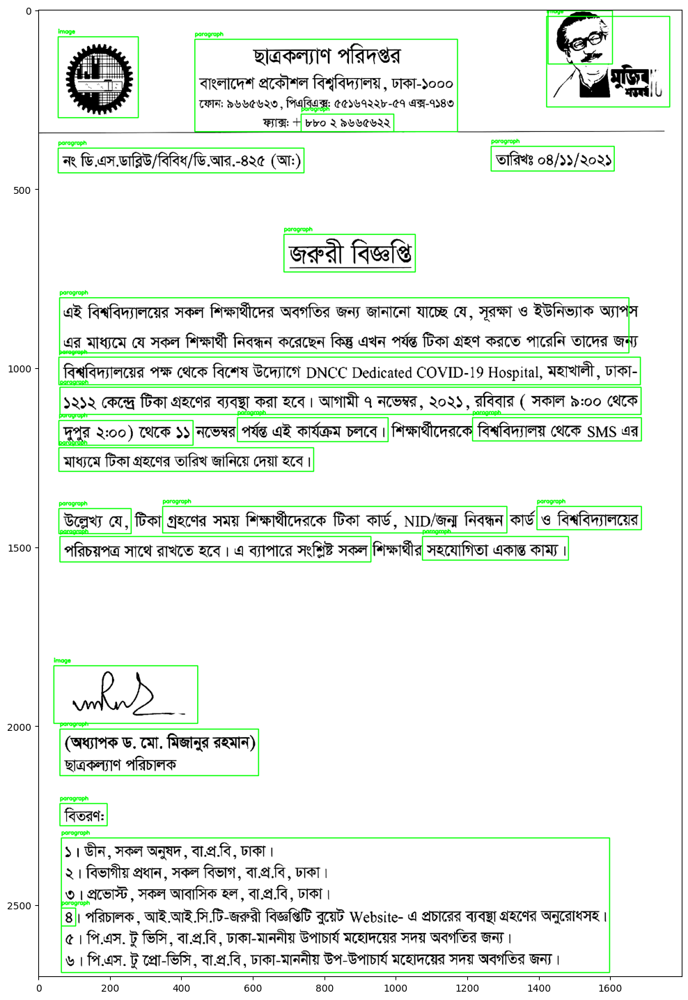

Success to load image at /kaggle/input/map-code-test-nov-14/mAP_test/RawImage/WordRand-img-423a-833d-179d651233ea.png


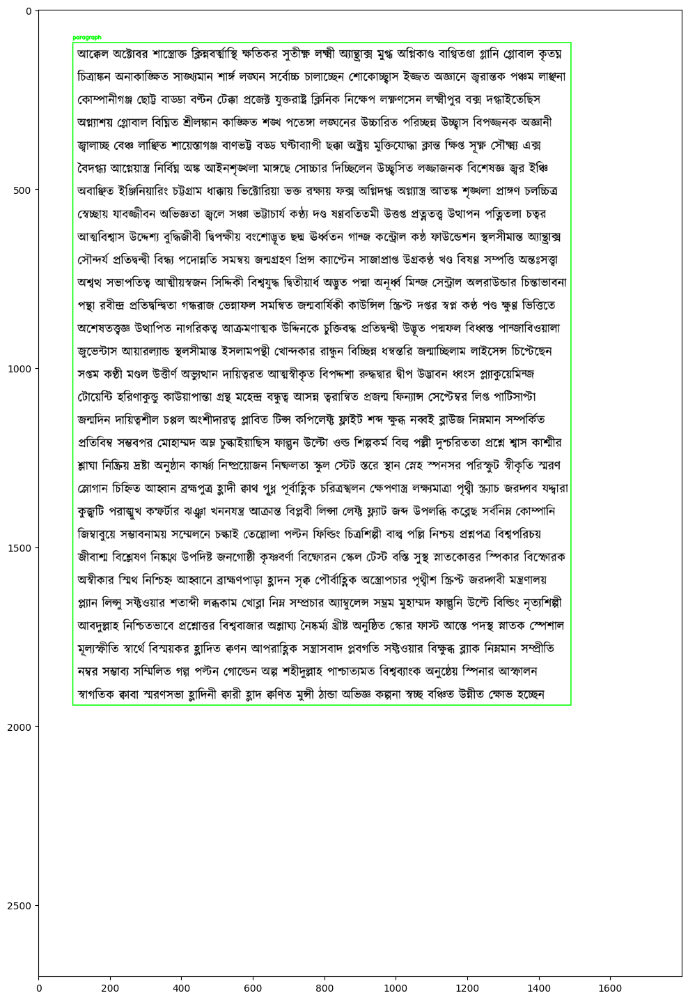

Success to load image at /kaggle/input/map-code-test-nov-14/mAP_test/RawImage/A2i91233-img-4e7a-bc22-82733e926851.png


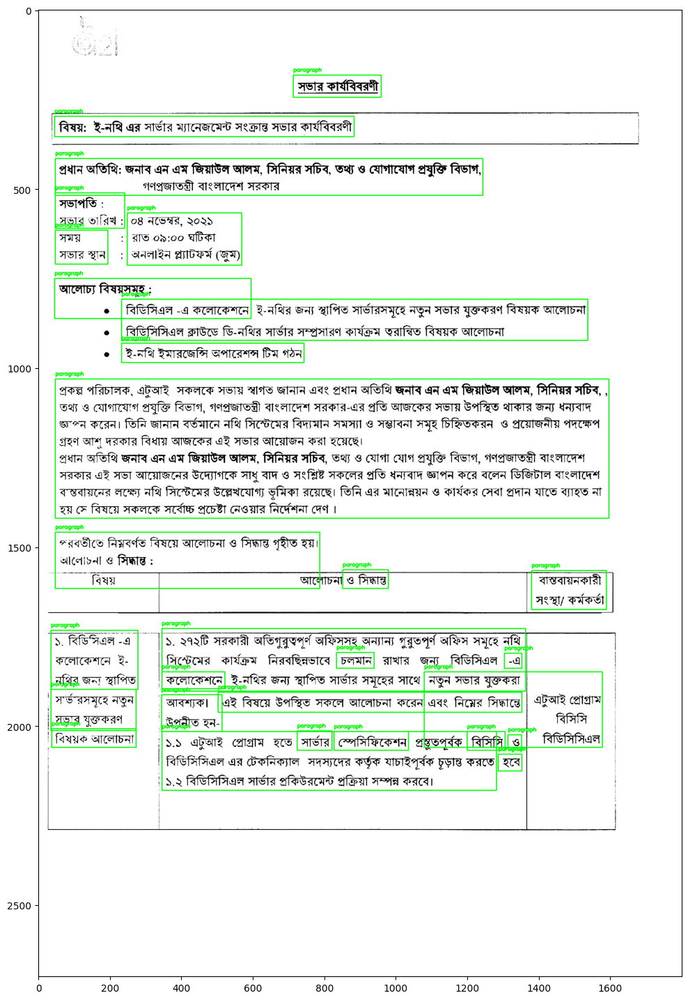

Success to load image at /kaggle/input/map-code-test-nov-14/mAP_test/RawImage/Page0044-img-4930-801c-fbd164235a1c.png


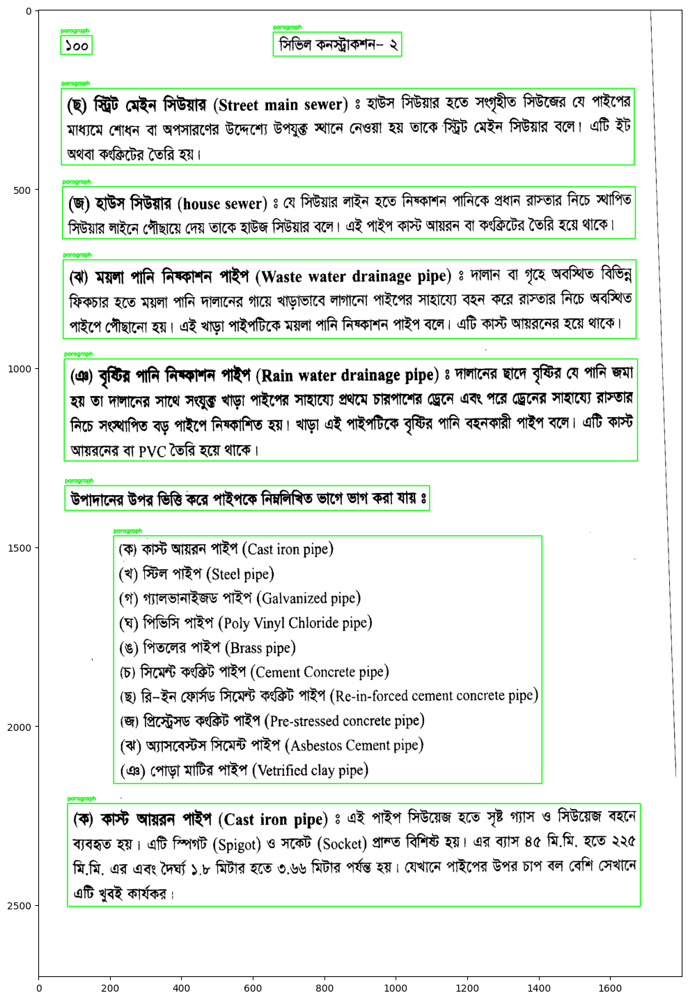

In [37]:
import json
import cv2
import os
from collections import defaultdict
from matplotlib import pyplot as plt

# # Load the JSON file
# with open('/kaggle/working/mapped_prediction.json') as f:
#     data = json.load(f)
    
# Load the JSON file
with open('/kaggle/working/updated_annotations_for_3Labels_segmentation_solved.json') as f:
    data = json.load(f)

# Extract the categories
categories = {category['id']: category['name'] for category in data['categories']}

# Create a dictionary to store the annotations for each image
image_annotations = defaultdict(list)
for annotation in data['annotations']:
    image_id = annotation['image_id']
    image_annotations[image_id].append(annotation)

# Loop through the images and display each image with its annotations
for image_info in data['images']:
    image_id = image_info['id']
    image_filename = image_info['file_name']
#     image_filename = image_filename.replace('.png', '.jpg')
#     image_path = os.path.join('/kaggle/input/updated-images-noise-removed/updated-images-noise-removed', image_filename)
    image_path = os.path.join('/kaggle/input/map-code-test-nov-14/mAP_test/RawImage', image_filename)
    image = cv2.imread(image_path)
#     # Resize the image to 1700x2800
#     image = cv2.resize(image, (1800, 2700))
#     print('Dimensions after resizing: ',img.shape)

    if image is None:
#         print(f"Failed to load image at {image_path}")
        continue
    else:
        print(f"Success to load image at {image_path}")

    # Convert the image from BGR to RGB for display with matplotlib
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Draw the annotations on the image
    for annotation in image_annotations[image_id]:
        category_id = annotation['category_id']
        bbox = annotation['bbox']
        xmin, ymin, xmax, ymax = map(int, bbox)

        # Draw the bounding box
        cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)

        # Add the category label
        label = categories[category_id]
        cv2.putText(image, label, (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Show the image using matplotlib
    plt.figure(figsize=(27,18))
    plt.imshow(image)
    plt.show()

In [38]:
# Scaled-mAP

import itertools
import numpy as np
import json

def calculate_iou(gt_box, pred_box):
    inter_box_top_left = [max(gt_box[0], pred_box[0]), max(gt_box[1], pred_box[1])]
    inter_box_bottom_right = [min(gt_box[0]+gt_box[2], pred_box[0]+pred_box[2]), min(gt_box[1]+gt_box[3], pred_box[1]+pred_box[3])]

    inter_box_w = inter_box_bottom_right[0] - inter_box_top_left[0]
    inter_box_h = inter_box_bottom_right[1] - inter_box_top_left[1]

    intersection = inter_box_w * inter_box_h
    union = gt_box[2] * gt_box[3] + pred_box[2] * pred_box[3] - intersection
    
    iou = intersection / union
#     print("iou : ", iou)

    return iou

def extract_bounding_box_info(json_file, gt_or_pt):
    with open(json_file, 'r') as f:
        json_data = json.load(f)
        
    bbox_info = []
    if gt_or_pt == "gt":
        for ann in json_data['annotations']:
            bbox = ann['bbox']
            bbox_info.append({
                'image_id': ann['image_id'],
#                 'bbox': [bbox[0], bbox[1], bbox[0] + bbox[2], bbox[1] + bbox[3]],
                'bbox': [bbox[0], bbox[1], bbox[2], bbox[3]],
                'category_id': ann['category_id']
            })
    else:
        for ann in json_data['annotations']:
            bbox = ann['bbox']
            bbox_info.append({
                'image_id': ann['image_id'],
                'bbox': [bbox[0], bbox[1], bbox[2] - bbox[0], bbox[3] - bbox[1]],
#                 'bbox': [bbox[0], bbox[1], bbox[0] + bbox[2], bbox[1] + bbox[3]],
                'category_id': ann['category_id']
            })
    return bbox_info

def scale_mAP(mAP, min_mAP=0.0, max_mAP=0.67, desired_min=0.0, desired_max=1.0):
    scaled_mAP = ((mAP - min_mAP) / (max_mAP - min_mAP)) * (desired_max - desired_min) + desired_min
    if scaled_mAP > 1:
        return 1
    return scaled_mAP

def calculate_image_mAP(gt_bboxes, pred_bboxes, image_id, iou_threshold=0.5):
    num_classes = len(set([bbox['category_id'] for bbox in gt_bboxes]))
#     print("num_classes = ", num_classes)


    # Mapping dictionary for image_id to num_classes
    image_id_to_num_classes = {0: 2, 1: 1, 2: 3, 3: 1}

#     # Mapping dictionary for image_id to num_classes
#     image_id_to_num_classes = {0: 1, 1: 1, 2: 3, 3: 2, 4 : 2, 5: 3, 6: 2, 7: 2, 8: 2, 9: 2}

    # Get num_classes based on image_id
    num_of_classes = image_id_to_num_classes.get(image_id, 0)
    
    print("Image_id = {}, num_of_classes = {}".format(image_id, num_of_classes))
    
    ap_sum = 0
    for class_id in range(num_classes):
        class_gt_bboxes = [bbox for bbox in gt_bboxes if bbox['category_id'] == class_id and bbox['image_id'] == image_id]
        class_pred_bboxes = [bbox for bbox in pred_bboxes if bbox['category_id'] == class_id and bbox['image_id'] == image_id]
        
        if len(class_gt_bboxes) == 0 or len(class_pred_bboxes) == 0:
            continue
        
#         sorted_pairs = sorted([(i, j, calculate_iou(gt_bbox['bbox'], pred_bbox['bbox']))
#                                for i, gt_bbox in enumerate(class_gt_bboxes)
#                                for j, pred_bbox in enumerate(class_pred_bboxes)],
#                               key=lambda x: x[2], reverse=False)

        sorted_pairs = sorted([(i, j, calculate_iou(gt_bbox['bbox'], pred_bbox['bbox']))
                               for i, gt_bbox in enumerate(class_gt_bboxes)
                               for j, pred_bbox in enumerate(class_pred_bboxes)], reverse=True)

        
        precision = []
        recall = []
        used_pred_indices = set()
        for i, j, iou in sorted_pairs:
            if iou >= iou_threshold and j not in used_pred_indices:
                used_pred_indices.add(j)
                tp = len(used_pred_indices)
                fp = len(class_pred_bboxes) - tp
                fn = len(class_gt_bboxes) - tp
                precision.append(tp / (tp + fp))
                recall.append(tp / (tp + fn))
        for i in range(len(precision) - 2, -1, -1):
            precision[i] = max(precision[i], precision[i+1])
        ap = 0
        for i in range(len(precision)):
            if i == 0:
                delta_recall = recall[i]
            else:
                # average precision (AP) using the trapezoidal rule to compute the area under the precision-recall curve
                delta_recall = recall[i] - recall[i-1]
            ap += precision[i] * delta_recall
        ap_sum += ap
    mAP = ap_sum / num_of_classes
    mAP = scale_mAP(mAP)
    
    return mAP

# Calling all the methods

# File paths for ground truth and prediction JSON files
gt_file_path = "/kaggle/input/json-3labels-gt-pt-24-nov-updated-v2/json-3labels-gt-pt-24-Nov-updated/annotations.coco.json"
# pred_file_path = "/kaggle/input/json-3labels-gt-pt-14-nov/json-3labels-gt-pt-14-Nov/updated_annotations_for_3Labels.json"
pred_file_path = "/kaggle/working/updated_annotations_for_3Labels_segmentation_solved.json"

# Load ground truth and prediction bounding box information
ground_truth_bboxes = extract_bounding_box_info(gt_file_path, "gt") # bbox = [x, y, w, h]
prediction_bboxes = extract_bounding_box_info(pred_file_path, "pt") # bbox = [x, y, w, h]

image_ids = set([bbox['image_id'] for bbox in ground_truth_bboxes])
image_mAPs = {}

for image_id in image_ids:
    image_mAP = calculate_image_mAP(ground_truth_bboxes, prediction_bboxes, image_id, iou_threshold=0.5)
    image_mAPs[image_id] = image_mAP

# Calculate mean of individual image mAPs
mean_image_mAP = sum(image_mAPs.values()) / len(image_mAPs)
print("Mean mAP for each image:")
for image_id, mAP in image_mAPs.items():
    print(f"Image ID: {image_id}, mAP: {mAP}")

print("Mean mAP across all images:", mean_image_mAP)

# Previous Output
# Image_id = 0, num_of_classes = 2
# Image_id = 1, num_of_classes = 1
# Image_id = 2, num_of_classes = 3
# Image_id = 3, num_of_classes = 1
# Mean mAP for each image:
# Image ID: 0, mAP: 0.8841661258922776
# Image ID: 1, mAP: 0.0
# Image ID: 2, mAP: 0.5114231474207908
# Image ID: 3, mAP: 1
# Mean mAP across all images: 0.5988973183282671

# Updated_after_solving_vertical_segmentation
# Image_id = 0, num_of_classes = 2
# Image_id = 1, num_of_classes = 1
# Image_id = 2, num_of_classes = 3
# Image_id = 3, num_of_classes = 1
# Mean mAP for each image:
# Image ID: 0, mAP: 0.8841661258922776
# Image ID: 1, mAP: 1
# Image ID: 2, mAP: 0.5531552762503271
# Image ID: 3, mAP: 1
# Mean mAP across all images: 0.8593303505356511

Image_id = 0, num_of_classes = 2
Image_id = 1, num_of_classes = 1
Image_id = 2, num_of_classes = 3
Image_id = 3, num_of_classes = 1
Mean mAP for each image:
Image ID: 0, mAP: 0.8841661258922776
Image ID: 1, mAP: 1
Image ID: 2, mAP: 0.5531552762503271
Image ID: 3, mAP: 1
Mean mAP across all images: 0.8593303505356511
